In [6]:
import pandas as pd
import numpy as np
import os
import pickle
import scipy.stats as st
import matplotlib.pyplot as plt
import matplotlib as mpl
from dynamic_routing_analysis import datacube_utils

mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42



In [3]:
loadpath=r'C:\Users\ethan.mcbride\OneDrive - Allen Institute\DR decoding results\by_session\blockwise_crossval_no_autos'

svc_results={}
decoder_results=os.listdir(loadpath)

for ii,ff in enumerate(decoder_results[:]):
    with open(os.path.join(loadpath,ff),'rb') as handle:
        svc_results[ii]=pickle.load(handle)
    print(ff)

626791_2022-08-15_0_blockwise_crossval_no_autos.pkl
626791_2022-08-17_0_blockwise_crossval_no_autos.pkl
636766_2023-01-23_0_blockwise_crossval_no_autos.pkl
636766_2023-01-24_0_blockwise_crossval_no_autos.pkl
636766_2023-01-25_0_blockwise_crossval_no_autos.pkl
636766_2023-01-26_0_blockwise_crossval_no_autos.pkl
644864_2023-01-30_0_blockwise_crossval_no_autos.pkl
644864_2023-01-31_0_blockwise_crossval_no_autos.pkl
644864_2023-02-01_0_blockwise_crossval_no_autos.pkl
644864_2023-02-02_0_blockwise_crossval_no_autos.pkl
644866_2023-02-07_0_blockwise_crossval_no_autos.pkl
644866_2023-02-09_0_blockwise_crossval_no_autos.pkl
644866_2023-02-10_0_blockwise_crossval_no_autos.pkl
644867_2023-02-20_0_blockwise_crossval_no_autos.pkl
644867_2023-02-22_0_blockwise_crossval_no_autos.pkl
644867_2023-02-23_0_blockwise_crossval_no_autos.pkl
649943_2023-02-13_0_blockwise_crossval_no_autos.pkl
649943_2023-02-14_0_blockwise_crossval_no_autos.pkl
649943_2023-02-15_0_blockwise_crossval_no_autos.pkl
649943_2023-

In [7]:
#extract decision function info

all_areas=[]
for sel_session in range(0,len(svc_results)):
    all_areas.append(list(svc_results[sel_session]['block_ids'].keys()))
    
all_areas=np.unique(np.hstack(all_areas))
unit_numbers=np.arange(0,len(svc_results[0]['unit_numbers']))
n_repeats=svc_results[0]['n_repeats']
timebin=0

dec_func={}
dec_func_shuffle={}

predict=['block_ids']



for sel_session in range(0,len(svc_results)):

    dec_func[sel_session]={}
    dec_func_shuffle[sel_session]={}

    for p in predict:
        dec_func[sel_session][p]={}
        dec_func_shuffle[sel_session][p]={}
        for n_units in unit_numbers:
            dec_func[sel_session][p][n_units]={}
            dec_func_shuffle[sel_session][p][n_units]={}
            for aa in all_areas:
                if aa in svc_results[sel_session][p].keys():
                    dec_func[sel_session][p][n_units][aa]={}
                    dec_func_shuffle[sel_session][p][n_units][aa]={}
                    if len(svc_results[sel_session][p][aa][timebin][n_units])>0:
                        dec_func_all=[]
                        dec_func_shuffle_all=[]
                        max_trialnum=[]
                        for repeat in range(0,n_repeats):
                            max_trialnum.append(np.max(svc_results[sel_session][p][aa][timebin][n_units][repeat]['trial_sel_idx']))
                            # max_trialnum.append(np.max(svc_results[sel_session][p][aa][timebin][n_units][repeat]['trial_sel_idx']))
                        max_trialnum=np.max(np.hstack(max_trialnum))+1
                        dec_func_temp=np.full((n_repeats,max_trialnum),np.nan)
                        dec_func_shuffle_temp=np.full((n_repeats,max_trialnum),np.nan)
                        for repeat in range(0,n_repeats):
                            # dec_func[sel_session][p][n_units][aa][repeat]=svc_results[sel_session][p][aa][timebin][n_units][repeat]['decision_function']
                            # dec_func_shuffle[sel_session][p][n_units][aa][repeat]=svc_results[sel_session][p][aa][timebin][n_units][repeat]['shuffle']['decision_function']
                            # dec_func_all.append(dec_func[sel_session][p][n_units][aa][repeat])
                            # dec_func_shuffle_all.append(dec_func_shuffle[sel_session][p][n_units][aa][repeat])
                            dec_func_temp[repeat,svc_results[sel_session][p][aa][timebin][n_units][repeat]['trial_sel_idx']] = svc_results[
                                sel_session][p][aa][timebin][n_units][repeat]['decision_function']
                            dec_func_shuffle_temp[repeat,svc_results[sel_session][p][aa][timebin][n_units][repeat]['trial_sel_idx']] = svc_results[
                                sel_session][p][aa][timebin][n_units][repeat]['shuffle']['decision_function']
                        
                        dec_func[sel_session][p][n_units][aa]['average']=np.nanmean(dec_func_temp,axis=0)
                        dec_func_shuffle[sel_session][p][n_units][aa]['average']=np.nanmean(dec_func_shuffle_temp,axis=0)


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23208\3695977642.py:54: RuntimeWarning: Mean of empty slice
  dec_func[sel_session][p][n_units][aa]['average']=np.nanmean(dec_func_temp,axis=0)
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23208\3695977642.py:55: RuntimeWarning: Mean of empty slice
  dec_func_shuffle[sel_session][p][n_units][aa]['average']=np.nanmean(dec_func_shuffle_temp,axis=0)


In [160]:
svc_results[0]['metadata'].session_id

'668755_2023-08-29'

KeyError: 'metadata'

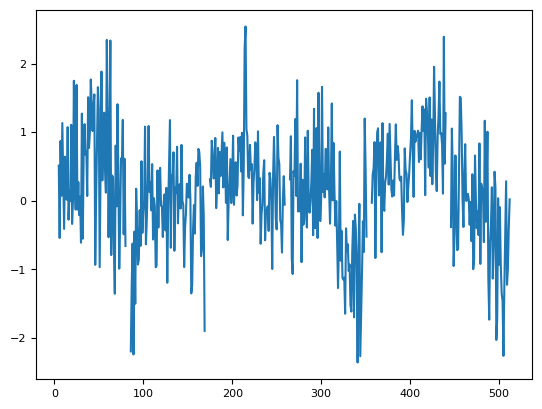

In [9]:
sel_session=9

fig,ax=plt.subplots(1,1)
ax.plot(dec_func[sel_session]['block_ids'][n_units]['all']['average'])
ax.set_title(svc_results[sel_session]['metadata'].session_id)
ax.set_xlabel('Trial number')
ax.set_ylabel('Decision function')

In [ ]:
svc_results[3]['block_ids']['all'][0][5][0]['shuffle'].keys()

In [11]:
decoder_results[sel_session][:17]

'644864_2023-02-02'

626791_2022-08-15 acc:0.11
dict_keys(['all', 'CA1_probeC', 'CP', 'LGd', 'MOs', 'VISpm', 'PO', 'VPM', 'LP', 'AUDp', 'CA1_probeB', 'DG_probeB', 'LD', 'RSPd', 'CA1_probeA', 'PS', 'AUDpo', 'IGL', 'BST', 'LPO', 'ZI', 'STR'])
626791_2022-08-17 acc:0.03
dict_keys(['all', 'MOp', 'CA1_probeC', 'CP', 'PoT', 'VISp', 'VISam', 'CA1_probeA', 'CA1_probeB', 'TEa', 'SGN', 'VISli', 'LP'])
636766_2023-01-23 acc:0.1
dict_keys(['all', 'SUB', 'CP_probeF', 'MOp_probeD', 'MOs', 'CA1', 'ACB', 'VISli', 'CP_probeA', 'VISp', 'MOp_probeA', 'AId', 'TEa', 'AIv'])
636766_2023-01-24 acc:0.05
dict_keys(['all', 'MOp_probeD', 'MOs', 'CP_probeF', 'AUDpo', 'ACB', 'VISp', 'CP_probeA', 'MOp_probeA', 'AId', 'CA1', 'AIv', 'PIR', 'PRE'])
636766_2023-01-25 acc:0.19
dict_keys(['all', 'MOs', 'CP', 'VISam', 'MOp', 'LSr', 'SUB_probeC', 'CA1', 'SUB_probeD', 'RSPv', 'SF', 'VISp_probeD', 'MRN_probeB', 'MRN_probeC', 'DG', 'POL', 'POST_probeC', 'cing_probeF', 'VISa', 'RSPagl_probeB'])
636766_2023-01-26 acc:0.15
dict_keys(['all', 'MOs', '

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_23208\2810553307.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(1,1)


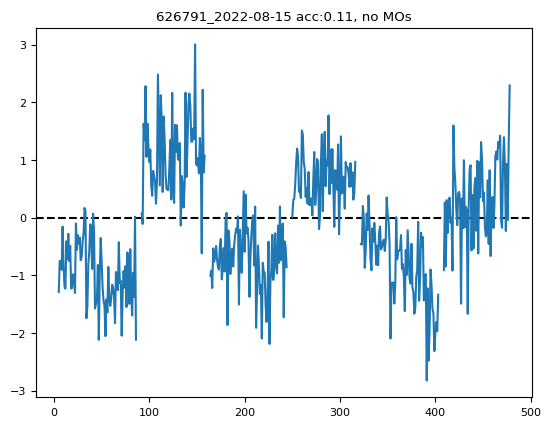

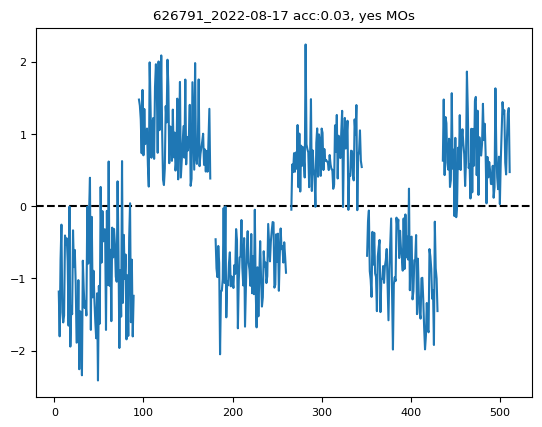

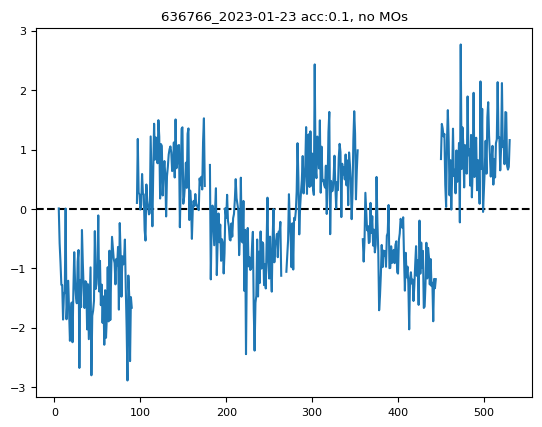

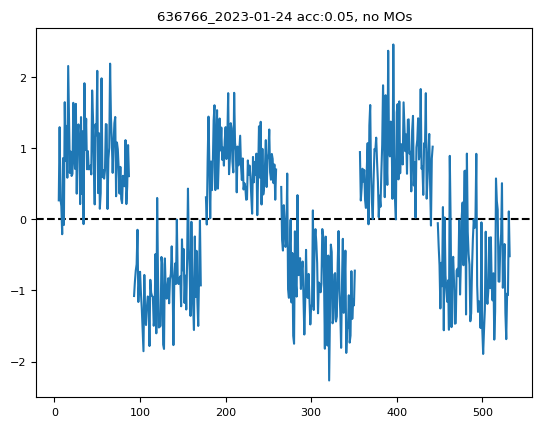

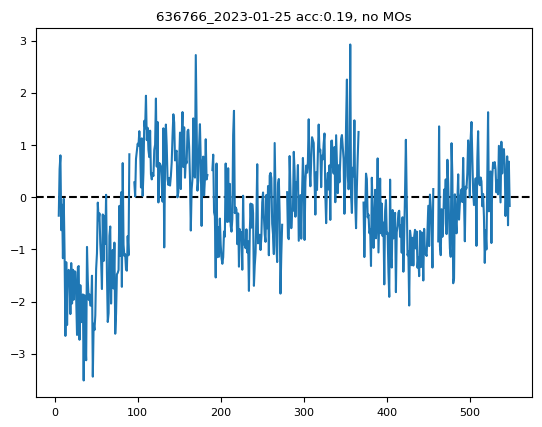

...

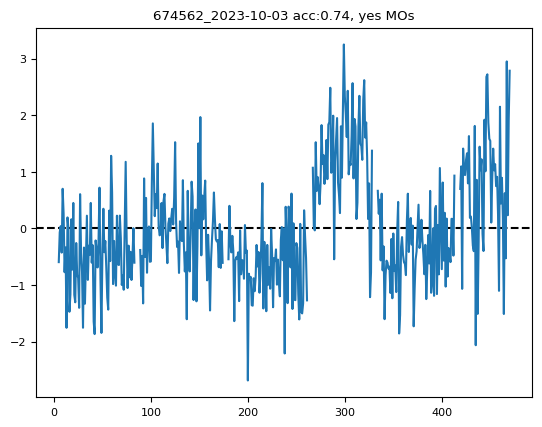

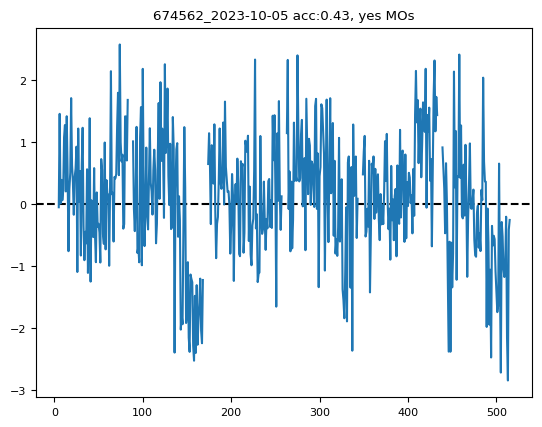

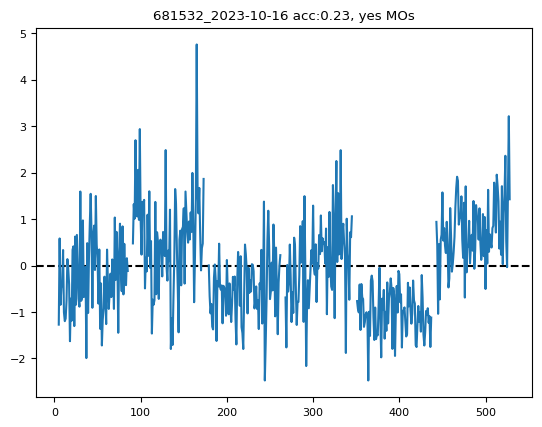

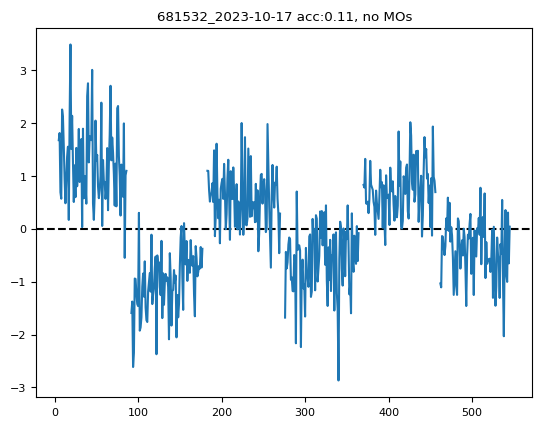

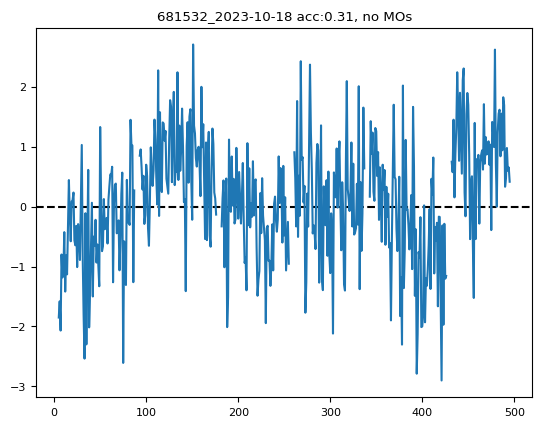

In [21]:
# # dec_func[sel_session][predict_var][n_units][area][average]
# sel_session=0
for sel_session in range(0,len(svc_results)):
    area_bal_acc=[]
    fig,ax=plt.subplots(1,1)
    ax.axhline(0,color='k',linestyle='--')
    ax.plot(dec_func[sel_session][p][n_units]['all']['average']/np.nanstd(dec_func[sel_session][p][n_units]['all']['average']))
    # ax.set_title(svc_results[sel_session]['metadata'].session_id)
    for nn in range(0,svc_results[sel_session]['n_repeats']):
        if len(svc_results[sel_session][p]['all'][0][n_units])>0:
            # area_dec_func.append(svc_results[sel_session][p]['all'][0][n_units][nn]['decision_function'])
            area_bal_acc.append(svc_results[sel_session][p]['all'][0][n_units][nn]['balanced_accuracy'])

    print(decoder_results[sel_session][:17]+' acc:'+str(np.round(np.nanmean(area_bal_acc),decimals=2)))
    print(svc_results[sel_session][p].keys())


    if 'MOs' in svc_results[sel_session][p].keys():
        ax.set_title(decoder_results[sel_session][:17]+' acc:'+str(np.round(np.nanmean(area_bal_acc),decimals=2))+', no MOs')
    else:
        ax.set_title(decoder_results[sel_session][:17]+' acc:'+str(np.round(np.nanmean(area_bal_acc),decimals=2))+', yes MOs')

# dec_func_shuffle[sel_session][p][n_units]['MOs']['average']
# ax.vlines(context_switch_trials['trial_index'].values,ymin=-3,ymax=3)


In [ ]:
svc_results[0].keys()

In [ ]:
session_id=svc_results[0]['metadata'].session_id


In [ ]:
session_trials = datacube_utils.get_df('trials', session_id=session_id).to_pandas()
session_trials.columns

In [ ]:
session_trials['is_correct'].mean()

In [ ]:
session_trials[['is_target','is_response','is_contingent_reward']]

In [ ]:
# session_trials.query('is_reward_scheduled and ((is_response and is_hit) or (not is_response and is_correct_reject))')
is_correct_response=((session_trials['is_target'] & session_trials['is_response']).values |
                     (session_trials['is_nontarget'] & ~session_trials['is_response']).values |
                     ((session_trials['stim_name']=='catch') & ~session_trials['is_response']).values)
np.mean(is_correct_response)

In [ ]:
# ((session_trials['stim_name']=='catch') & ~session_trials['is_response'])

In [147]:
# np.mean(session_trials['is_target'] == ~session_trials['is_nontarget'])
# session_trials.query('not is_target and not is_nontarget')['stim_name']

In [ ]:
session_performance = datacube_utils.get_df('performance', session_id=session_id).to_pandas()
session_performance

In [5]:
all_areas=np.unique(np.hstack(all_areas))
unit_numbers=np.arange(0,len(svc_results[0]['unit_numbers']))

# decoder_conf_context_switch[area][n_units]

decoder_conf_context_switch={}

# dprime_threshold=1.5

# loop through areas
for aa in all_areas:
    decoder_conf_context_switch[aa]={}

    # loop through n units
    for n_units in unit_numbers:
        decoder_conf_context_switch[aa][n_units]={}
        decoder_conf_context_switch[aa][n_units]['decision_function']=[]
        decoder_conf_context_switch[aa][n_units]['session']=[]
        decoder_conf_context_switch[aa][n_units]['before_dprime']=[]
        decoder_conf_context_switch[aa][n_units]['after_dprime']=[]
        decoder_conf_context_switch[aa][n_units]['total_units']=[]
        decoder_conf_context_switch[aa][n_units]['correct_responses']=[]


for sel_session in range(0,len(svc_results)):
    session_id=svc_results[sel_session]['metadata'].session_id
    print(session_id)
    session_trials = datacube_utils.get_df('trials', session_id=session_id).to_pandas()

    #load session table
    
    is_correct_response=((session_trials['is_target'] & session_trials['is_response']).values |
                         (session_trials['is_nontarget'] & ~session_trials['is_response']).values |
                         ((session_trials['stim_name']=='catch') & ~session_trials['is_response']).values)

    # loop through context switches, append
    context_switch_trials=session_trials.query('is_context_switch')
    session_performance = datacube_utils.get_df('performance', session_id=session_id).to_pandas()
    cross_modal_dprime=session_performance['cross_modal_dprime'].values

    trials_before=20
    trials_after=30

    p='block_ids'

    for aa in all_areas:
        for n_units in unit_numbers:
            if aa in dec_func[sel_session][p][n_units].keys():
                if len(dec_func[sel_session][p][n_units][aa])>0:
                    temp_dec_func = dec_func[sel_session][p][n_units][aa]['average']/np.nanstd(dec_func[sel_session][p][n_units][aa]['average'])
                    
                    for it,(tt,switch_trial) in enumerate(context_switch_trials.iterrows()):
                        # if (cross_modal_dprime[tt]>=dprime_threshold)&(cross_modal_dprime[tt+1]>=dprime_threshold):
                            
                        decoder_conf_context_switch[aa][n_units]['session'].append(session_id)
                        decoder_conf_context_switch[aa][n_units]['before_dprime'].append(cross_modal_dprime[it])
                        decoder_conf_context_switch[aa][n_units]['after_dprime'].append(cross_modal_dprime[it+1])
                        decoder_conf_context_switch[aa][n_units]['total_units'].append(svc_results[sel_session][p][aa]['n_units'])
                        decoder_conf_context_switch[aa][n_units]['correct_responses'].append(is_correct_response[switch_trial['trial_index']-trials_before:
                                                                                                                 switch_trial['trial_index']+trials_after])
                        
                        if switch_trial['context_name']=='vis':
                            decoder_conf_context_switch[aa][n_units]['decision_function'].append(temp_dec_func[switch_trial['trial_index']-trials_before:
                                                                                                               switch_trial['trial_index']+trials_after])
                        elif switch_trial['context_name']=='aud':
                            decoder_conf_context_switch[aa][n_units]['decision_function'].append(-temp_dec_func[switch_trial['trial_index']-trials_before:
                                                                                                                switch_trial['trial_index']+trials_after])



KeyError: 'metadata'

In [ ]:
cross_modal_dprime[:]

In [ ]:
context_switch_trials['trial_index']

In [ ]:
context_switch_trials['block_index']

In [ ]:
session_id

In [ ]:
#save data

savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\DR decoding results\across_context_changes"
with open(os.path.join(savepath,'decoder_conf_context_switch_blockwise_crossval_no_autos.pkl'), 'wb') as file: 
      
    # A new file will be created 
    pickle.dump(decoder_conf_context_switch, file) 

In [4]:
#load data

loadpath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\DR decoding results\across_context_changes"
with open(os.path.join(loadpath,'decoder_conf_context_switch_updated.pkl'), 'rb') as file: 
      
    # A new file will be created 
    decoder_conf_context_switch=pickle.load(file) 

In [13]:
all_areas=list(decoder_conf_context_switch.keys())
unit_numbers=np.arange(0,len(svc_results[0]['unit_numbers']))
n_repeats=svc_results[0]['n_repeats']
timebin=0

In [22]:
# decoder_conf_context_switch['ACAd'].keys()
# unit_numbers
decoder_conf_context_switch[aa][n_units].keys()

dict_keys(['decision_function', 'session', 'before_dprime', 'after_dprime', 'total_units', 'correct_responses'])

In [23]:
decoder_conf_context_switch_same_length={}
# loop through areas
for aa in all_areas:
    decoder_conf_context_switch_same_length[aa]={}

    # loop through n units
    for n_units in unit_numbers:
        temp_dec_func=[]
        if len(decoder_conf_context_switch[aa][n_units])>0:
            target_len=len(decoder_conf_context_switch[aa][n_units]['decision_function'])
            for xx in decoder_conf_context_switch[aa][n_units]:
                if len(xx)==target_len:
                    temp_dec_func.append(xx)
            if len(temp_dec_func)>0:
                decoder_conf_context_switch_same_length[aa][n_units]=np.vstack(temp_dec_func)
            else:
                decoder_conf_context_switch_same_length[aa][n_units]=[]

In [ ]:
# savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\DR decoding results\across_context_changes"
# with open(os.path.join(savepath,'decoder_conf_context_switch_same_length.pkl'), 'wb') as file: 
      
#     # A new file will be created 
#     pickle.dump(decoder_conf_context_switch_same_length, file) 

In [ ]:

# trials_before=20
# trials_after=30
# import pandas as pd

In [ ]:
np.nanmean(np.vstack(decoder_conf_dprime_thresh['decision_function'].values),axis=0)

Text(0, 0.5, 'prev <- normalized context confidence -> current')

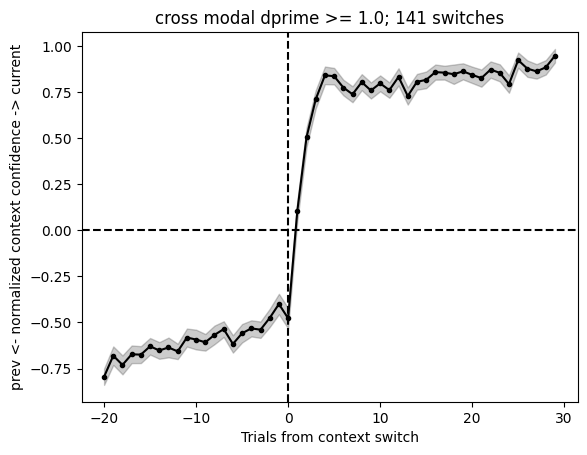

In [26]:

trials_before=20
trials_after=30

sel_area='all'
sel_nunits=5
dprime_min_threshold=1.0
# dprime_max_threshold=5.0

temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_nunits])

# row_len=[]

# for rr,row in temp_decoder_conf_df.iterrows():
#     row_len.append(len(row['decision_function']))

decoder_conf_dprime_thresh=temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')# and \
                                                       #before_dprime<=@dprime_max_threshold and after_dprime<=@dprime_max_threshold')
decision_function=np.vstack(decoder_conf_dprime_thresh['decision_function'].values)

correct_responses=np.vstack(decoder_conf_dprime_thresh['correct_responses'].values) 
mean_correct_responses=np.nanmean(correct_responses,axis=0)
mean_correct_responses[0:trials_before+1]=-mean_correct_responses[0:trials_before+1]

fig,ax=plt.subplots(1,1)
# ax.plot(np.arange(-trials_before,trials_after),np.vstack(decoder_conf_dprime_thresh['decision_function'].values).T)
ax.plot(np.arange(-trials_before,trials_after),np.nanmean(np.vstack(decision_function),axis=0),'k.-')
ax.fill_between(np.arange(-trials_before,trials_after),
                np.nanmean(np.vstack(decision_function),axis=0)+
                st.sem(np.vstack(decision_function),axis=0),
                np.nanmean(np.vstack(decision_function),axis=0)-
                st.sem(np.vstack(decision_function),axis=0),
                color='k',alpha=0.2)

# ax.plot(np.arange(-trials_before,trials_after),mean_correct_responses,'k--')

ax.axvline(0,color='k',linestyle='--')
ax.axhline(0,color='k',linestyle='--')
ax.set_title('cross modal dprime >= '+str(dprime_min_threshold)+'; '+str(decision_function.shape[0])+' switches')
ax.set_xlabel('Trials from context switch')
ax.set_ylabel('prev <- normalized context confidence -> current')

In [ ]:
# sel_area='all'
# sel_window=2

# fig,ax=plt.subplots(1,1)
# ax.plot(np.arange(-trials_before,trials_after),decoder_conf_context_switch_same_length[sel_area][sel_window].T)
# ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decoder_conf_context_switch_same_length[sel_area][sel_window],axis=0),'k.-',linewidth=2)
# ax.axvline(0,color='k',linestyle='--')
# ax.axhline(0,color='k',linestyle='--')


In [118]:
sel_nunits=2
dprime_min_threshold=1.0

switches_per_area={
    'area':[],
    'num_switches':[],
}

for sel_area in all_areas:
    temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_nunits])
    switches_per_area['area'].append(sel_area)
    switches_per_area['num_switches'].append(len(temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')))

switches_per_area=pd.DataFrame.from_dict(switches_per_area)

In [62]:
pd.DataFrame.from_dict(switches_per_area).sort_values(by='num_switches',ascending=False)[:40]

,area,num_switches
116,all,141
50,MOs,106
106,VISp,101
18,CP,95
15,CA1,95
20,DG,85
49,MOp,80
76,RSPagl,61
91,SSp,59
38,LP,58


Text(0.5, 1.0, 'n=20 units per area; dprime >= 1.0')

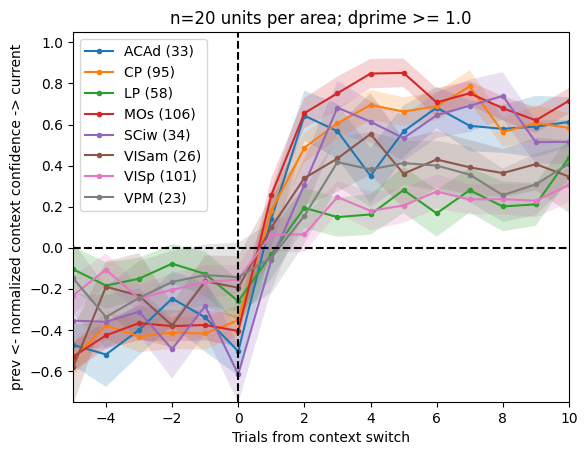

In [130]:
fig,ax=plt.subplots(1,1)
sel_n_units=2
dprime_min_threshold=1.0

# subset_areas=['ACAd','ACAv','CA1','CP','FRP','LGd','MGd','MOp','MOs','ORBl','SCiw','SCsg','VISam','VISp']
# subset_areas=['ACAd','MOs','MRN','ORBl','SCiw','SCsg','PAG','VISp',]
# subset_areas=['ACAd','CP','LP','MOp','MOs','MRN','ORBl','SCiw','VISam','VISp']
subset_areas=['ACAd','CP','LP','MOs','SCiw','VISam','VISp','VPM']

# area_n=[]

for ia,sel_area in enumerate(subset_areas):

    if ia<10:
        set_linestyle='-'
        set_marker='.'
    else:
        set_linestyle='--'
        set_marker='^'
        
    if sel_n_units in decoder_conf_context_switch[sel_area].keys():
        temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_n_units])

        decoder_conf_dprime_thresh=temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')
        if len(decoder_conf_dprime_thresh)==0:
            continue

        decision_function=np.vstack(decoder_conf_dprime_thresh['decision_function'].values)

        ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0),
                label=sel_area+' ('+str(len(decoder_conf_dprime_thresh))+')',
                marker=set_marker,linestyle=set_linestyle)
        ax.fill_between(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0)-st.sem(decision_function,axis=0),
                        np.nanmean(decision_function,axis=0)+st.sem(decision_function,axis=0),alpha=0.2)

ax.axvline(0,color='k',linestyle='--')
ax.axhline(0,color='k',linestyle='--')
ax.legend()
ax.set_xlim([-5,10])
ax.set_ylim([-0.75,1.05])
ax.set_xlabel('Trials from context switch')
ax.set_ylabel('prev <- normalized context confidence -> current')
ax.set_title('n='+str(svc_results[0]['unit_numbers'][sel_n_units])+' units per area; dprime >= '+str(dprime_min_threshold))

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_30596\3680782539.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(1,1)
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: divide by zero encountered in divide
  ret = um.true_divide(
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning

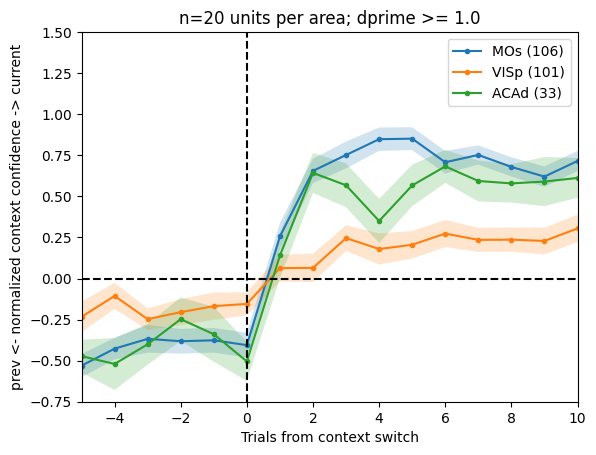

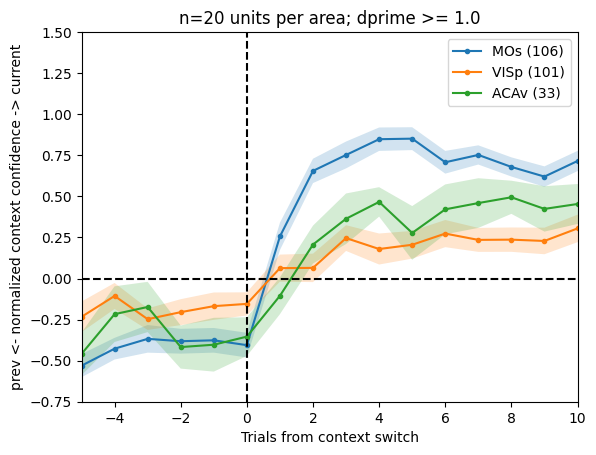

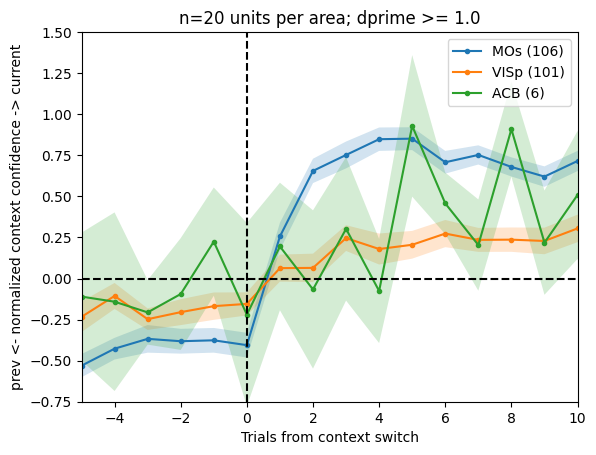

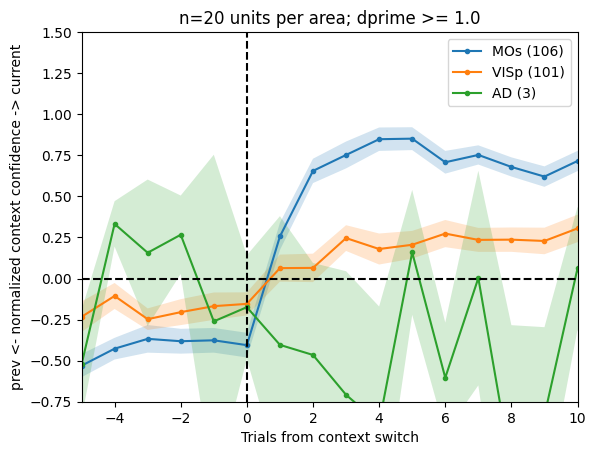

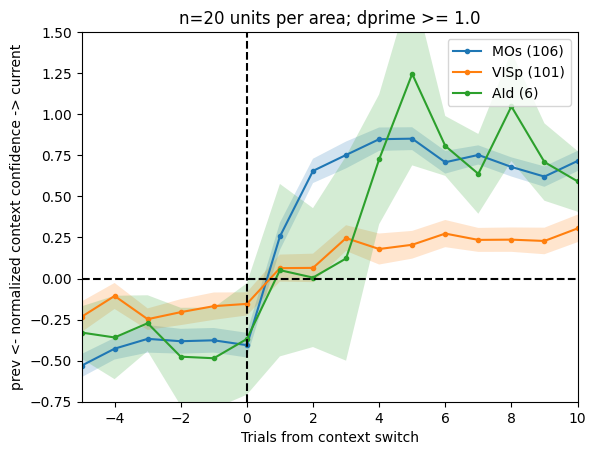

...

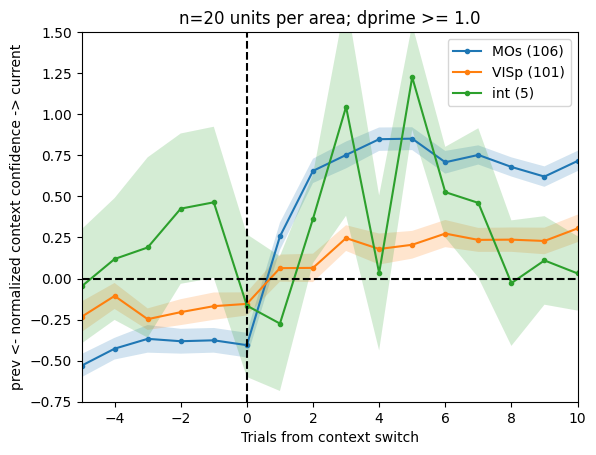

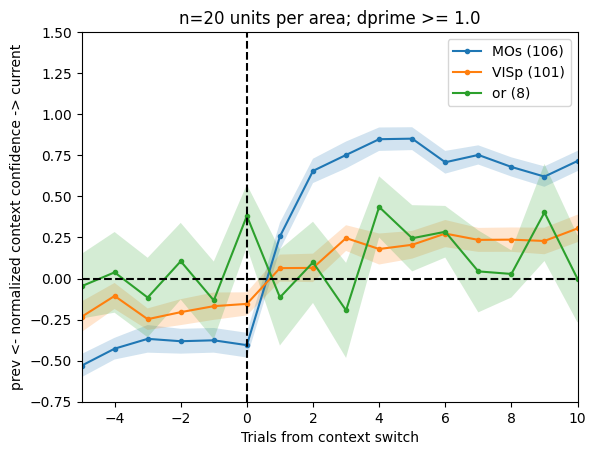

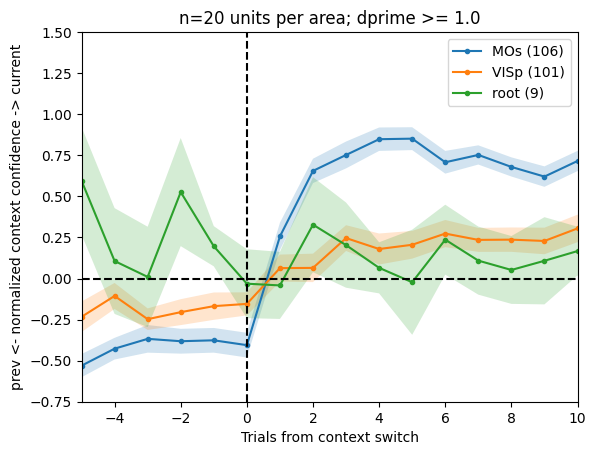

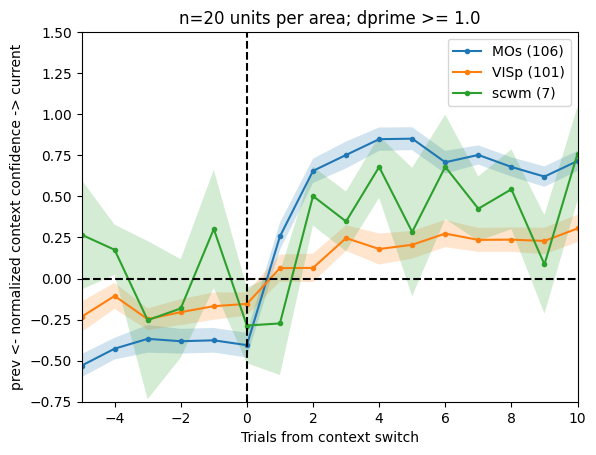

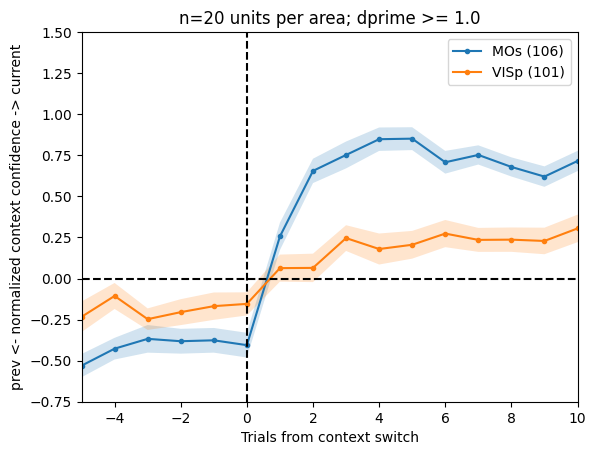

In [67]:
#plot all areas w/ MOs and VISp

for aa in all_areas:
    if aa in ['MOs','VISp']:
        continue
    fig,ax=plt.subplots(1,1)
    sel_n_units=2
    dprime_min_threshold=1.0

    subset_areas=['MOs','VISp',aa]

    # area_n=[]

    for ia,sel_area in enumerate(subset_areas):

        if ia<10:
            set_linestyle='-'
            set_marker='.'
        else:
            set_linestyle='--'
            set_marker='^'
            
        if sel_n_units in decoder_conf_context_switch[sel_area].keys():
            temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_n_units])

            decoder_conf_dprime_thresh=temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')
            if len(decoder_conf_dprime_thresh)==0:
                continue

            decision_function=np.vstack(decoder_conf_dprime_thresh['decision_function'].values)

            ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0),
                    label=sel_area+' ('+str(len(decoder_conf_dprime_thresh))+')',
                    marker=set_marker,linestyle=set_linestyle)
            ax.fill_between(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0)-st.sem(decision_function,axis=0),
                            np.nanmean(decision_function,axis=0)+st.sem(decision_function,axis=0),alpha=0.2)

    ax.axvline(0,color='k',linestyle='--')
    ax.axhline(0,color='k',linestyle='--')
    ax.legend()
    ax.set_xlim([-5,10])
    ax.set_ylim([-0.75,1.5])
    ax.set_xlabel('Trials from context switch')
    ax.set_ylabel('prev <- normalized context confidence -> current')
    ax.set_title('n='+str(svc_results[0]['unit_numbers'][sel_n_units])+' units per area; dprime >= '+str(dprime_min_threshold))

Text(0.5, 1.0, 'n=20 units per area; dprime >= 1.0')

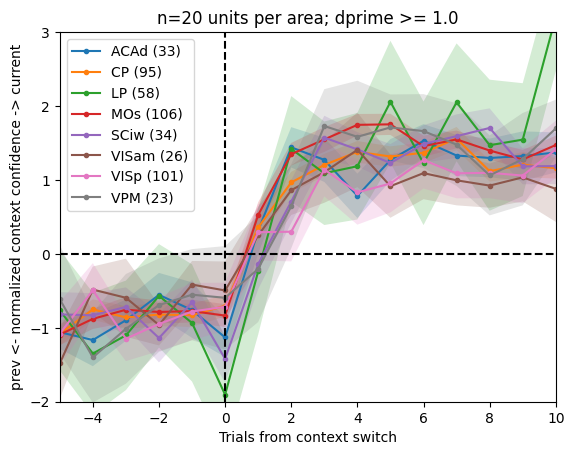

In [132]:
## Normalize each area to preswitch trials

fig,ax=plt.subplots(1,1)
sel_n_units=2
dprime_min_threshold=1.0

# subset_areas=['ACAd','ACAv','CA1','CP','FRP','LGd','MGd','MOp','MOs','ORBl','SCiw','SCsg','VISam','VISp']
# subset_areas=['ACAd','MOs','MRN','ORBl','SCiw','SCsg','PAG','VISp',]
# subset_areas=['ACAd','CP','MOs','MRN','ORBl','SCiw','VISam','VISp']
subset_areas=['ACAd','CP','LP','MOs','SCiw','VISam','VISp','VPM']

# area_n=[]

for ia,sel_area in enumerate(subset_areas):

    if ia<10:
        set_linestyle='-'
        set_marker='.'
    else:
        set_linestyle='--'
        set_marker='^'
        
    if sel_n_units in decoder_conf_context_switch[sel_area].keys():
        temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_n_units])

        decoder_conf_dprime_thresh=temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')
        if len(decoder_conf_dprime_thresh)==0:
            continue

        decision_function=np.vstack(decoder_conf_dprime_thresh['decision_function'].values)
        preswitch_mean=np.nanmean(decision_function[:,0:20])

        decision_function=decision_function/-preswitch_mean

        ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0),
                label=sel_area+' ('+str(len(decoder_conf_dprime_thresh))+')',
                marker=set_marker,linestyle=set_linestyle)
        ax.fill_between(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0)-st.sem(decision_function,axis=0),
                        np.nanmean(decision_function,axis=0)+st.sem(decision_function,axis=0),alpha=0.2)

ax.axvline(0,color='k',linestyle='--')
ax.axhline(0,color='k',linestyle='--')
ax.legend()
ax.set_xlim([-5,10])
ax.set_ylim([-2,3])
ax.set_xlabel('Trials from context switch')
ax.set_ylabel('prev <- normalized context confidence -> current')
ax.set_title('n='+str(svc_results[0]['unit_numbers'][sel_n_units])+' units per area; dprime >= '+str(dprime_min_threshold))


Text(0.5, 1.0, 'n=20 units per area; dprime >= 1.0')

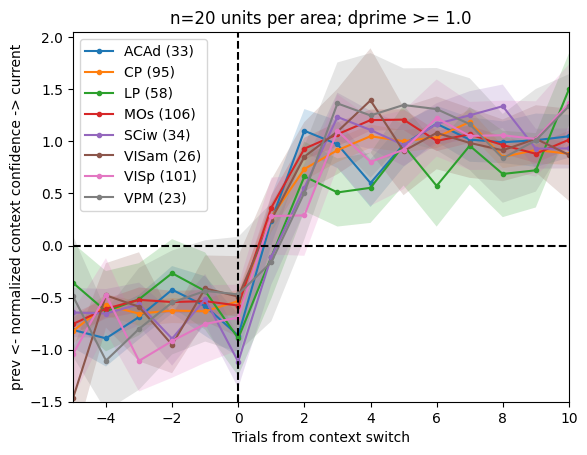

In [134]:
## Normalize each area to preswitch trials

fig,ax=plt.subplots(1,1)
sel_n_units=2
dprime_min_threshold=1.0

# subset_areas=['ACAd','ACAv','CA1','CP','FRP','LGd','MGd','MOp','MOs','ORBl','SCiw','SCsg','VISam','VISp']
# subset_areas=['ACAd','MOs','MRN','ORBl','SCiw','SCsg','PAG','VISp',]
# subset_areas=['ACAd','CP','MOs','MRN','ORBl','SCiw','VISam','VISp']
subset_areas=['ACAd','CP','LP','MOs','SCiw','VISam','VISp','VPM']

# area_n=[]

for ia,sel_area in enumerate(subset_areas):

    if ia<10:
        set_linestyle='-'
        set_marker='.'
    else:
        set_linestyle='--'
        set_marker='^'
        
    if sel_n_units in decoder_conf_context_switch[sel_area].keys():
        temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_n_units])

        decoder_conf_dprime_thresh=temp_decoder_conf_df.query('before_dprime>=@dprime_min_threshold and after_dprime>=@dprime_min_threshold')
        if len(decoder_conf_dprime_thresh)==0:
            continue

        decision_function=np.vstack(decoder_conf_dprime_thresh['decision_function'].values)
        postswitch_mean=np.nanmean(decision_function[:,30:50])

        decision_function=decision_function/postswitch_mean

        ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0),
                label=sel_area+' ('+str(len(decoder_conf_dprime_thresh))+')',
                marker=set_marker,linestyle=set_linestyle)
        ax.fill_between(np.arange(-trials_before,trials_after),np.nanmean(decision_function,axis=0)-st.sem(decision_function,axis=0),
                        np.nanmean(decision_function,axis=0)+st.sem(decision_function,axis=0),alpha=0.2)

ax.axvline(0,color='k',linestyle='--')
ax.axhline(0,color='k',linestyle='--')
ax.legend()
ax.set_xlim([-5,10])
ax.set_ylim([-1.5,2.05])
ax.set_xlabel('Trials from context switch')
ax.set_ylabel('prev <- normalized context confidence -> current')
ax.set_title('n='+str(svc_results[0]['unit_numbers'][sel_n_units])+' units per area; dprime >= '+str(dprime_min_threshold))


In [104]:
#get p values for each area/trial relative to change

n_trials_after=10

decoding_p_values={
    'area':[],
}

for it in range(1,1+n_trials_after):
    decoding_p_values['trial_'+str(it)]=[]


trial_idx=np.arange(21,21+n_trials_after)

for sel_area in all_areas:
    temp_decoder_conf_df=pd.DataFrame.from_dict(decoder_conf_context_switch[sel_area][sel_n_units])
    if len(temp_decoder_conf_df)==0:
        continue
    for it,tt in enumerate(trial_idx):
        _,pval=st.wilcoxon(np.vstack(temp_decoder_conf_df['decision_function'].values)[:,tt])
        decoding_p_values['trial_'+str(it+1)].append(pval)
    decoding_p_values['area'].append(sel_area)

decoding_p_values=pd.DataFrame.from_dict(decoding_p_values)

In [105]:
decoding_p_values

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
0,ACAd,0.840555,0.000038,0.000007,0.002141,0.000247,1.793997e-07,0.000002,3.869957e-04,0.002054,0.000003
1,ACAv,0.122789,0.022255,0.020911,0.000302,0.032907,1.078144e-03,0.006149,6.777742e-07,0.004221,0.000182
2,ACB,0.921875,0.695312,0.556641,0.845703,0.160156,5.566406e-01,0.375000,8.398438e-02,0.845703,0.492188
3,AD,0.812500,0.812500,0.187500,0.187500,0.437500,6.250000e-01,1.000000,8.125000e-01,0.812500,0.812500
4,AId,0.845703,0.695312,0.492188,0.013672,0.037109,6.445312e-02,0.027344,1.953125e-03,0.001953,0.003906
...,...,...,...,...,...,...,...,...,...,...,...
107,fp,0.625000,0.625000,0.125000,1.000000,0.062500,3.125000e-01,0.437500,3.125000e-01,0.812500,0.312500
108,int,0.812500,0.312500,0.437500,1.000000,0.062500,1.875000e-01,0.312500,1.000000e+00,0.625000,0.812500
109,or,0.524475,0.488708,0.846924,0.302795,0.846924,1.688232e-01,0.421204,3.027954e-01,0.252380,0.934082
110,root,0.846924,0.168823,0.120544,0.083252,0.977966,5.535889e-02,0.207764,2.768555e-01,0.803955,0.094604


In [106]:
decoding_p_values.query('trial_1<0.05')

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
44,MOp,0.001105,1.142684e-07,2.574032e-12,4.774290e-11,3.597088e-13,2.912100e-16,5.317596e-14,5.757483e-11,4.224956e-12,8.169160e-13
45,MOs,0.019493,8.552814e-13,8.012570e-16,4.810388e-19,4.970887e-18,4.266194e-17,1.135588e-17,3.004702e-18,3.114345e-15,8.932482e-18
100,all,0.000920,3.567735e-16,1.693438e-21,3.640827e-22,1.283639e-24,1.079317e-26,3.031725e-23,1.272630e-23,1.013140e-21,1.077127e-23


In [107]:
decoding_p_values.query('trial_2<0.05 and trial_1>0.05')

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
0,ACAd,0.840555,3.833805e-05,6.539436e-06,2.141291e-03,2.471991e-04,1.793997e-07,2.124600e-06,3.869957e-04,2.054234e-03,2.838461e-06
1,ACAv,0.122789,2.225482e-02,2.091055e-02,3.023480e-04,3.290739e-02,1.078144e-03,6.149407e-03,6.777742e-07,4.221027e-03,1.815296e-04
14,BST,0.375000,3.710938e-02,8.457031e-01,6.953125e-01,1.601562e-01,5.566406e-01,1.933594e-01,2.753906e-01,3.750000e-01,6.250000e-01
18,CP,0.061566,2.276909e-12,3.990347e-15,1.090589e-17,2.687783e-17,3.276843e-19,1.333884e-17,4.899756e-14,2.641999e-13,4.206400e-13
39,MB,0.166364,7.534182e-03,2.770892e-07,1.422329e-06,9.035825e-06,5.654185e-05,1.789222e-04,1.455233e-04,1.897147e-04,4.394608e-05
46,MPT,0.431641,5.859375e-03,5.566406e-01,3.906250e-03,1.953125e-02,1.308594e-01,9.218750e-01,6.445312e-02,4.316406e-01,3.710938e-02
47,MRN,0.757179,6.727061e-07,1.373120e-09,1.311671e-09,3.501628e-07,1.155783e-07,2.615939e-08,3.397941e-06,2.664392e-07,3.648749e-06
50,OLF,0.431641,1.953125e-03,1.953125e-03,1.308594e-01,3.750000e-01,4.882812e-02,1.933594e-01,1.054688e-01,2.734375e-02,5.566406e-01
51,ORBl,0.083252,8.544922e-04,3.051758e-04,6.103516e-04,6.103516e-05,6.103516e-05,1.220703e-04,6.103516e-05,3.356934e-03,1.159668e-03
65,ProS,0.121134,8.039847e-04,2.856589e-03,2.027770e-06,2.765930e-04,5.008771e-05,2.951354e-04,1.007792e-05,3.617795e-05,1.990244e-03


In [108]:
decoding_p_values.query('trial_3<0.05 and trial_2>0.05 and trial_1>0.05')

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
8,APN,0.431685,0.679870,0.000443,0.038734,0.013681,0.001730,0.000077,0.000055,0.010661,0.000730
15,CA1,0.520968,0.115099,0.015071,0.035469,0.000252,0.000365,0.004378,0.000017,0.009237,0.006215
19,DG,0.954055,0.455439,0.016328,0.114295,0.001052,0.027818,0.217394,0.002643,0.001463,0.007616
23,FRP,1.000000,0.083984,0.001953,0.019531,0.001953,0.193359,0.013672,0.037109,0.013672,0.037109
29,ILA,0.105469,0.695312,0.027344,0.037109,0.130859,0.375000,0.048828,0.064453,0.105469,0.232422
33,LH,0.322266,0.556641,0.009766,0.037109,0.001953,0.193359,0.037109,0.019531,0.232422,0.064453
34,LP,0.984693,0.249687,0.045495,0.066924,0.003711,0.015027,0.050928,0.020265,0.002720,0.000253
58,POL,0.507704,0.066702,0.001816,0.107315,0.025505,0.832509,0.020275,0.006726,0.023650,0.691519
66,RSPagl,0.190339,0.193938,0.001231,0.001081,0.000197,0.007541,0.000292,0.000097,0.000089,0.000020
72,SCig,0.542528,0.096102,0.010598,0.000872,0.000024,0.012048,0.005383,0.020850,0.003223,0.003744


In [109]:
decoding_p_values.query('trial_4<0.05 and trial_3>0.05 and trial_2>0.05 and trial_1>0.05')

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
4,AId,0.845703,0.695312,0.492188,0.013672,0.037109,0.064453,2.734375e-02,0.001953,0.001953,0.003906
16,CA3,0.056093,0.326943,0.731207,0.000829,0.012532,0.069042,5.976045e-01,0.326943,0.020295,0.001990
26,ICd,0.921875,0.232422,0.625000,0.048828,1.000000,0.001953,9.218750e-01,0.769531,0.769531,0.193359
30,LD,0.205410,0.569858,0.100397,0.030985,0.018529,0.036435,3.841842e-02,0.001583,0.529105,0.027741
31,LGd,0.338788,0.080196,0.287229,0.008069,0.020275,0.894860,2.751843e-01,0.873988,0.853200,0.200216
54,PAG,0.120544,0.389404,0.094604,0.000122,0.021545,0.012451,1.159668e-03,0.000305,0.018066,0.002014
57,PO,0.231797,0.100185,0.096771,0.005055,0.139660,0.001098,8.569914e-07,0.007408,0.231797,0.093448
64,PoT,0.168373,0.522282,0.087071,0.003007,0.093448,0.012395,1.962146e-03,0.028726,0.090215,0.038734
69,RT,0.803955,0.977966,0.276855,0.035339,0.041260,0.330261,1.353760e-01,0.094604,0.005371,0.006714
85,VAL,0.695312,0.193359,0.232422,0.037109,0.048828,0.769531,1.367188e-02,0.037109,0.019531,0.037109


In [110]:
decoding_p_values.query('trial_5<0.05 and trial_4>0.05 and trial_3>0.05 and trial_2>0.05 and trial_1>0.05')

,area,trial_1,trial_2,trial_3,trial_4,trial_5,trial_6,trial_7,trial_8,trial_9,trial_10
53,ORBvl,0.695312,0.083984,0.083984,0.193359,0.013672,0.027344,0.375000,0.160156,0.193359,0.005859
77,SNr,0.275391,0.921875,0.193359,0.193359,0.037109,0.431641,0.193359,0.695312,0.003906,0.037109
81,SUB,0.853982,0.263156,0.063579,0.055618,0.023820,0.003233,0.393135,0.353635,0.018857,0.170919
99,ZI,0.524475,0.302795,0.135376,0.561401,0.035339,0.421204,0.120544,0.072998,0.890381,1.000000


In [124]:
trial_switch_significant={
    'area':[],
    'ntrials':[],
    'n_switches':[]
}


for it in range(1,1+n_trials_after):

    if it==1:
        query_message='trial_'+str(it)+'<0.05'
    else:
        query_message='trial_'+str(it)+'<0.05 and '+' and '.join(['trial_'+str(ii)+'>0.05' for ii in range(1,it)])
    
    temp_switch_sig=decoding_p_values.query(query_message)
    
    for aa in temp_switch_sig['area']:
        trial_switch_significant['n_switches'].append(switches_per_area.query('area==@aa')['num_switches'].values[0])
        trial_switch_significant['area'].append(aa)
        trial_switch_significant['ntrials'].append(it)

    # print(decoding_p_values.query(query_message)['area'])
trial_switch_significant=pd.DataFrame.from_dict(trial_switch_significant)


In [146]:
trial_switch_significant.query('ntrials==6 and n_switches>=10')['area'].values

array(['MGv', 'PRE', 'RSPv'], dtype=object)

In [126]:
trial_switch_significant.to_csv(r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\decoding_by_area_swanson_map\trial_switch_significant.csv")

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_30596\17907955.py:20: RuntimeWarning: Mean of empty slice
  ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0),label=sel_area,marker=set_marker,linestyle=set_linestyle)


ValueError: x and y must have same first dimension, but have shapes (50,) and (1,)

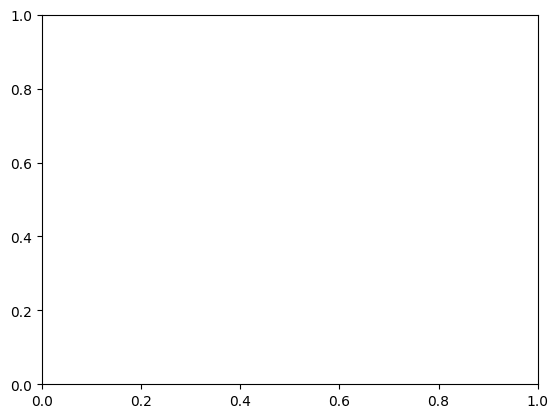

In [83]:
fig,ax=plt.subplots(1,1)
sel_n_units=2

# subset_areas=['ACAd','ACAv','CA1','CP','FRP','LGd','MGd','MOp','MOs','ORBl','SCiw','SCsg','VISam','VISp']
# subset_areas=['ACAd','MOs','MRN','ORBl','SCiw','SCsg','PAG','VISp',]
subset_areas=['ACAd','MOs','ORBl','SCiw','VISam','VISp']

for ia,sel_area in enumerate(subset_areas):

    if ia<10:
        set_linestyle='-'
        set_marker='.'
    else:
        set_linestyle='--'
        set_marker='^'
        
    

    if sel_n_units in decoder_conf_context_switch_same_length[sel_area].keys():
        ax.plot(np.arange(-trials_before,trials_after),np.nanmean(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0),label=sel_area,marker=set_marker,linestyle=set_linestyle)
        ax.fill_between(np.arange(-trials_before,trials_after),np.nanmean(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0)-st.sem(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0),
                        np.nanmean(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0)+st.sem(decoder_conf_context_switch_same_length[sel_area][sel_n_units],axis=0),alpha=0.2)

ax.axvline(0,color='k',linestyle='--')
ax.axhline(0,color='k',linestyle='--')
ax.legend()
ax.set_xlim([-2,5])
ax.set_ylim([-0.7,1.25])
ax.set_xlabel('Trials from context switch')
ax.set_ylabel('prev <- normalized context confidence -> current')
ax.set_title('n='+str(svc_results[0]['unit_numbers'][sel_n_units])+' units per area')

In [ ]:
decoder_conf_context_switch_same_length[sel_area].keys()

In [ ]:
# fig,ax=plt.subplots(1,1)
# ax.plot(session_trials['is_vis_context'],color='g')
# ax.plot(session_trials['is_aud_context'],color='b')
len(session_trials)

In [ ]:
len(svc_results[32]['block_ids']['all'][0][0][0]['decision_function'])

In [ ]:
# #load session trial tables to align with decoding results

# # for sel_session in range(0,1):#len(svc_results)):

# sel_session=0
# session_id=svc_results[sel_session]['metadata'].session_id
# print(session_id)

# #load session table

# context_switch_trials=session_trials.query('is_context_switch')

# trials_before=20
# trials_after=30

# p='block_ids'

# for aa in all_areas:
#     for n_units in unit_numbers:
#         if aa in dec_func[sel_session][p][n_units].keys():
#             if len(dec_func[sel_session][p][n_units][aa])>0:
#                 temp_dec_func = dec_func[sel_session][p][n_units][aa]['average']/np.nanstd(dec_func[sel_session][p][n_units][aa]['average'])
                
#                 for st,switch_trial in context_switch_trials.iterrows():
#                     if switch_trial['context_name']=='vis':
#                         decoder_conf_context_switch[aa][n_units].append(temp_dec_func[switch_trial['trial_index']-trials_before:
#                                                                                       switch_trial['trial_index']+trials_after])
#                     elif switch_trial['context_name']=='aud':
#                         decoder_conf_context_switch[aa][n_units].append(-temp_dec_func[switch_trial['trial_index']-trials_before:
#                                                                                        switch_trial['trial_index']+trials_after])
        


In [ ]:
dec_func[sel_session][p][n_units].keys()

In [ ]:
temp_dec_func[switch_trial['trial_index']-trials_before:switch_trial['trial_index']+trials_after]
switch_trial['context_name']

In [ ]:
fig,ax=plt.subplots(1,1)
ax.plot(np.arange(-trials_before,trials_after),np.vstack(decoder_conf_context_switch['all'][5]).T)

In [ ]:
session_trials.query('is_context_switch')